# Import requirment package

## Install requirment package

In [ ]:
!pip install PyWavelets
!pip install arch
!pip install pandas==1.5.2   # sarima_article run_sarima  run_arima   arch_article  run_arch
!pip install keras-tuner
!pip install xlsxwriter

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 22.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 982.9/982.9 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 50.5 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.1.4
    Uninstalling pandas-2.1.4:
      Successfully uninstalled pandas-2.1.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 1.18.0 requires pandas>=1.5.3, but you have pandas 1.5.2 which is incompatible.
cudf-cu12 24.4.1 requires pandas<2.2.2dev0,>=2.0, but you have pandas 1.5.2 which is incompatible.
google-colab 1.0.0 requires pandas==2.1.4, but you have pandas 1.5.2 which is incompatible.
ibis-framework 9.2.0 requires pandas<3,>=1.5.3, but you have pandas 1.5.2 which is incompatible.
mizani 0.11.4 requires pandas>=2.1.0, but you have pandas 1

## Import package

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pywt
import matplotlib.gridspec as gridspec
from typing import Dict, List
import random
import scipy.stats as stats
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose
from pandas.plotting import autocorrelation_plot
import itertools
from arch import arch_model
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error


## Import Functions

In [ ]:
import processing_without_docs
from processing_without_docs import *
import arima_sarima_arch_without_docs
from arima_sarima_arch_without_docs import *
import lstm
from lstm import *
import cnn_without_docs
from cnn_without_docs import *
import wavelet_cnn_lstm
from wavelet_cnn_lstm import *

# Import data

In [ ]:
!git clone https://github.com/bilelammouri/Gold-Price-Forecasting-Evidence-from-Deep-Learning/tree/main/Data

In [ ]:
# Load the Excel file
file_path = 'data.xlsx'  # Provide the path to your Excel file here
sheets_to_read = ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataframes = read_excel_sheets(file_path, sheets_to_read)

In [ ]:
file_names = ['data.xlsx', 'data-1970.xlsx', 'data-2010.xlsx']
base_names = ['data', 'data_79', 'data_10']
sheet_names = ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily'] #data_10_Quarterly_EoP

# Call the function to load the sheets into DataFrames as global variables
load_excel_sheets_as_variables(file_names, base_names, sheet_names)

# Data Processing

## Wavelet decomposition

It is really not necessary to decompose the signal into the maximum levels. Normally, it is enough to decompose a signal into 3 to 9 levels. Here, we specify the decomposition level to 6.

/usr/local/lib/python3.10/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(


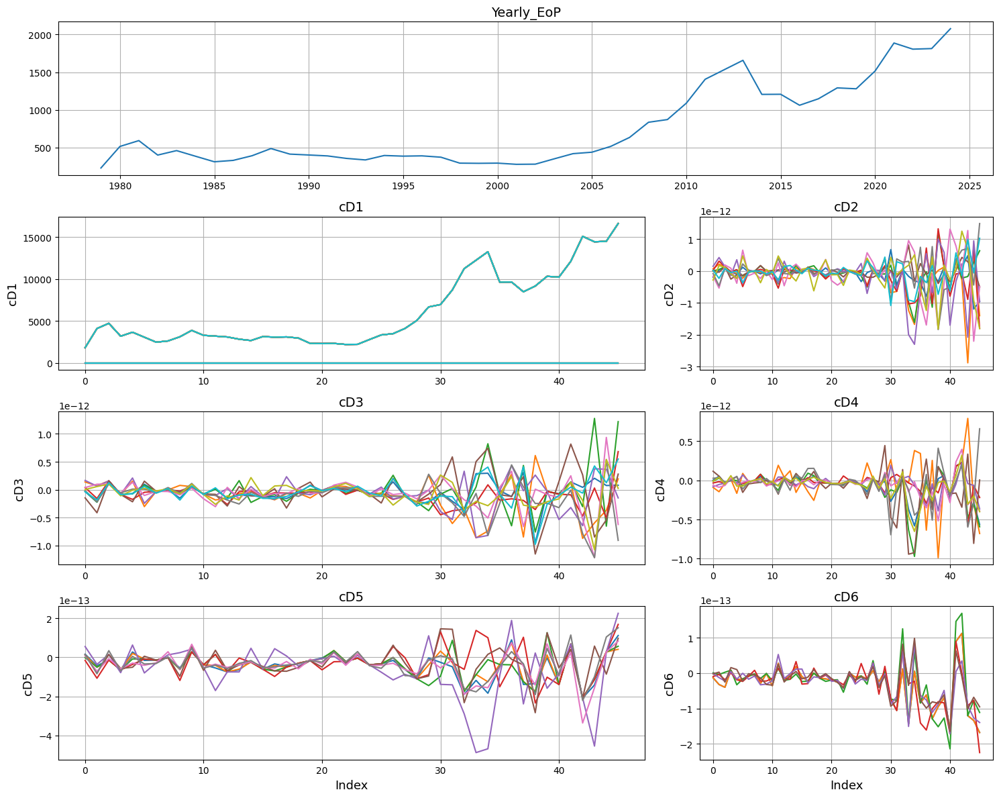

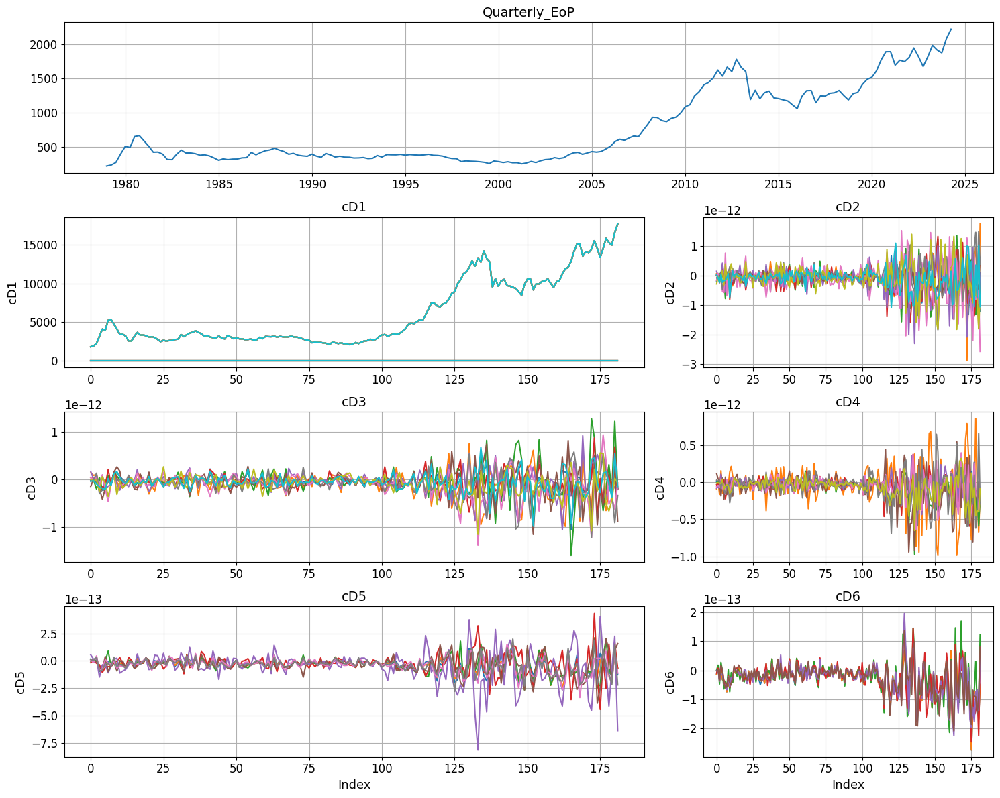

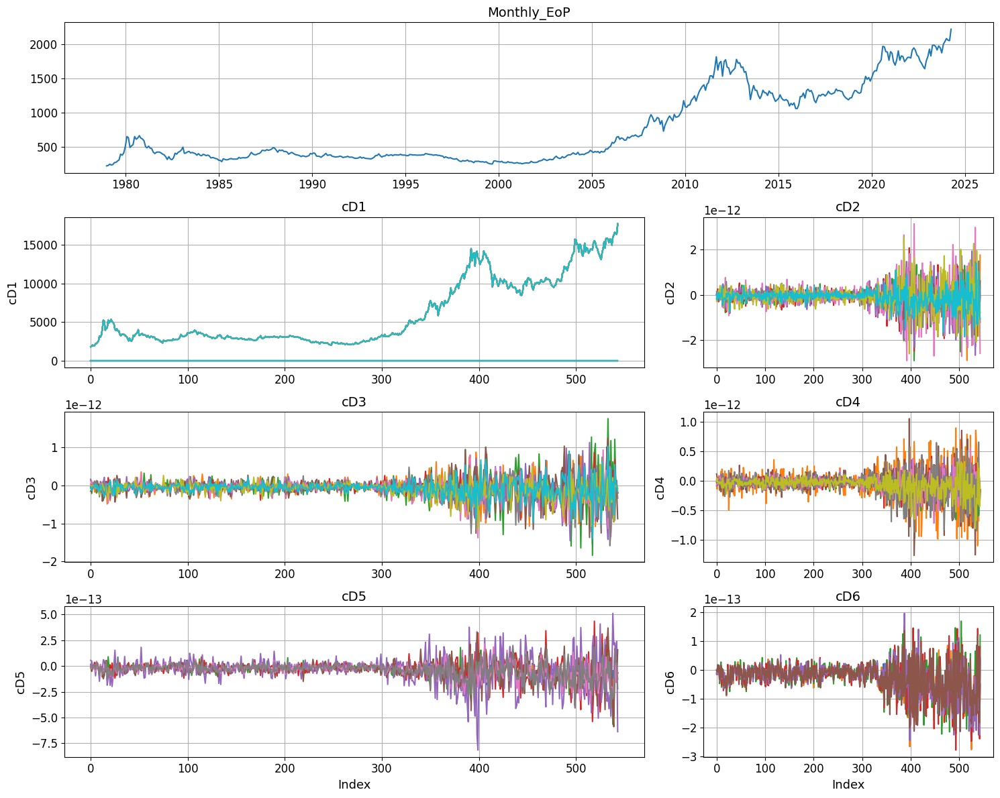

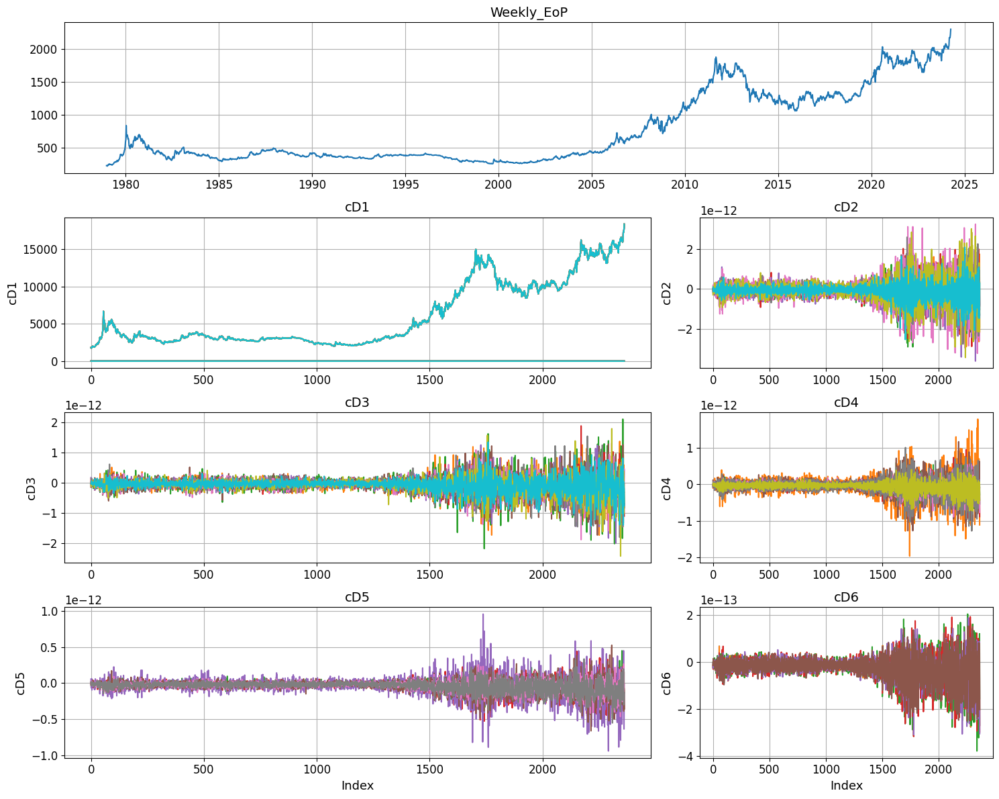

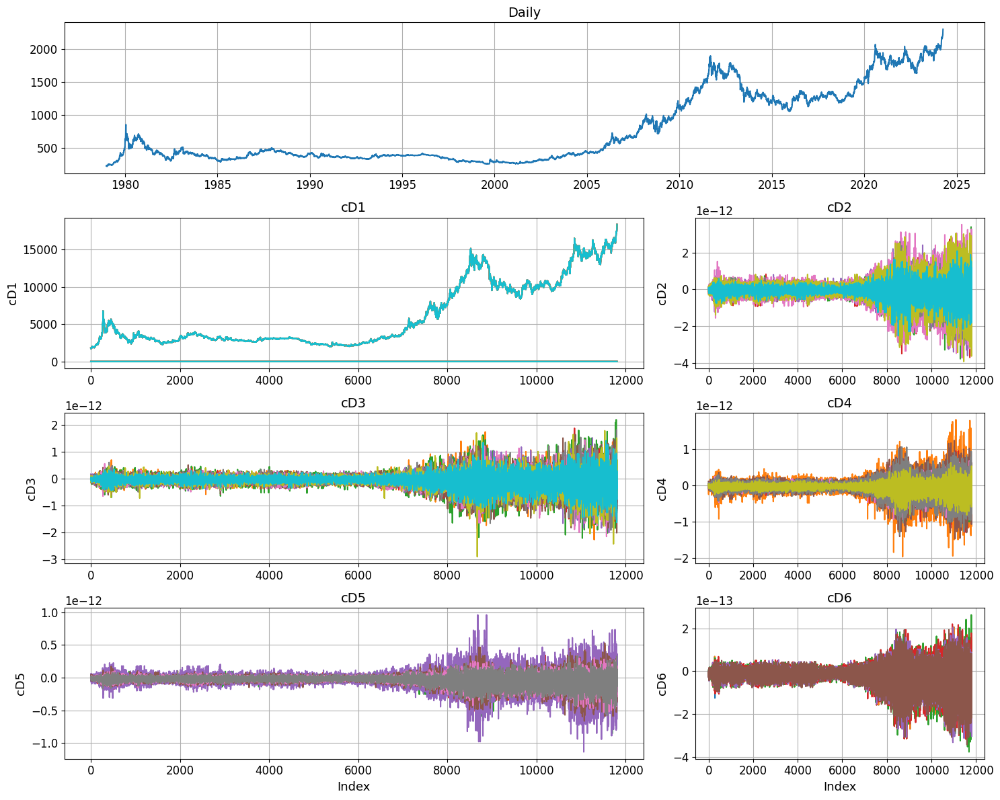

In [ ]:
# Example usage for each sheet:
sheet_names = ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
#wavelet_types = ['db6', 'cmor', 'morl', 'haar']

# Assuming dataframes is a dictionary containing all sheets as DataFrames
dataframes = pd.read_excel('data.xlsx', sheet_name=sheet_names)

for sheet in sheet_names:
    wavelet_decomposition_and_plot(sheet, dataframes, wavelet_name='db6', save_fig=True)


## Spectrum

/usr/local/lib/python3.10/dist-packages/pywt/_cwt.py:117: FutureWarning: Wavelets from the family cmor, without parameters specified in the name are deprecated. The name should takethe form cmorB-C where B and C are floats representing the bandwidth frequency and center frequency, respectively (example: cmor1.5-1.0).
  wavelet = DiscreteContinuousWavelet(wavelet)
/usr/local/lib/python3.10/dist-packages/pywt/_cwt.py:117: FutureWarning: Wavelets from the family cmor, without parameters specified in the name are deprecated. The name should takethe form cmorB-C where B and C are floats representing the bandwidth frequency and center frequency, respectively (example: cmor1.5-1.0).
  wavelet = DiscreteContinuousWavelet(wavelet)
/usr/local/lib/python3.10/dist-packages/pywt/_cwt.py:117: FutureWarning: Wavelets from the family cmor, without parameters specified in the name are deprecated. The name should takethe form cmorB-C where B and C are floats representing the bandwidth frequency and cent

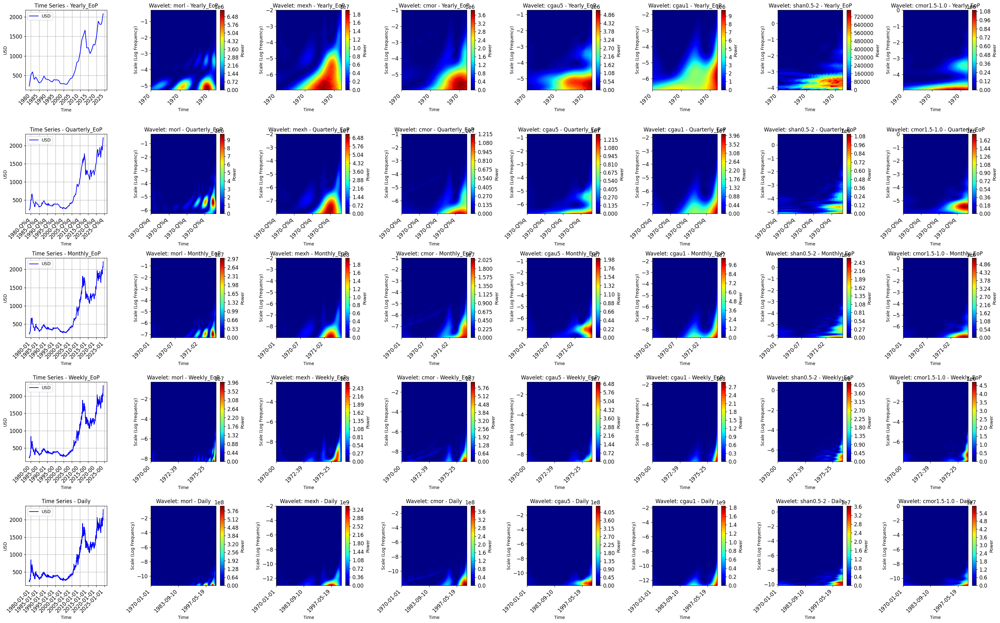

In [ ]:
# Example usage
file_path = 'data.xlsx'  # Provide the path to your Excel file here
sheets = ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily'] # Replace with your sheet names
time_levels = ['yearly', 'quarterly', 'monthly', 'weekly', 'daily']    # Specify the time level for each sheet
wavelet_types = ['morl', 'mexh', 'cmor', 'cgau5', 'cgau1', 'shan0.5-2', 'cmor1.5-1.0']  # Specify the wavelet types
wavelet_analysis_and_plot(file_path, sheets, time_levels, wavelet_types)


## Regimes detection

### Wavelet analysis

/usr/local/lib/python3.10/dist-packages/pywt/_cwt.py:117: FutureWarning: Wavelets from the family cmor, without parameters specified in the name are deprecated. The name should takethe form cmorB-C where B and C are floats representing the bandwidth frequency and center frequency, respectively (example: cmor1.5-1.0).
  wavelet = DiscreteContinuousWavelet(wavelet)
/usr/local/lib/python3.10/dist-packages/pywt/_cwt.py:117: FutureWarning: Wavelets from the family cmor, without parameters specified in the name are deprecated. The name should takethe form cmorB-C where B and C are floats representing the bandwidth frequency and center frequency, respectively (example: cmor1.5-1.0).
  wavelet = DiscreteContinuousWavelet(wavelet)
/usr/local/lib/python3.10/dist-packages/pywt/_cwt.py:117: FutureWarning: Wavelets from the family cmor, without parameters specified in the name are deprecated. The name should takethe form cmorB-C where B and C are floats representing the bandwidth frequency and cent

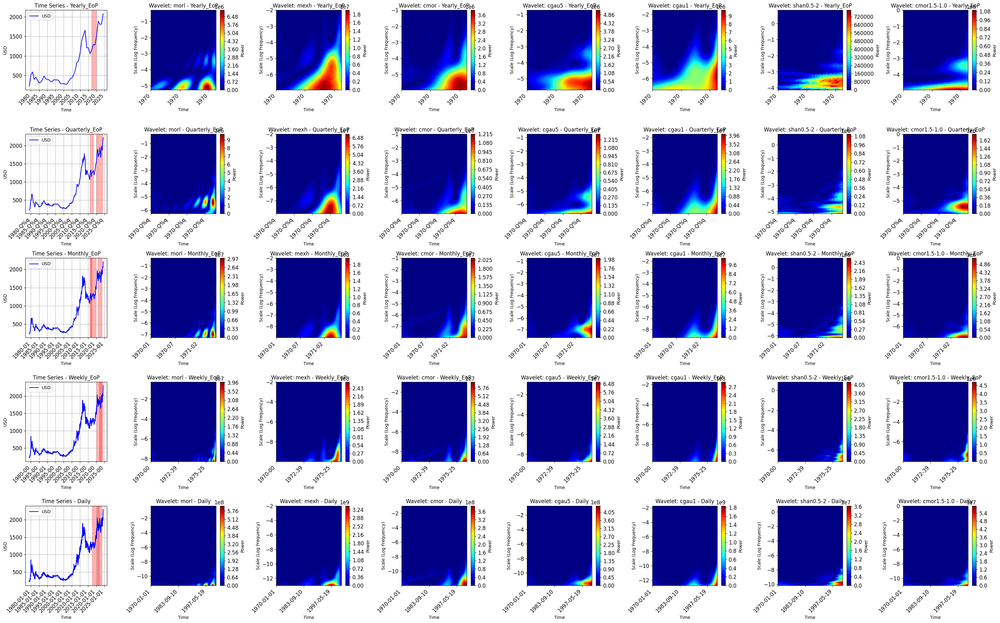

In [ ]:
#
file_path = 'data.xlsx'  # Provide the path to your Excel file here
sheets = ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily'] # Replace with your sheet names
time_levels = ['yearly', 'quarterly', 'monthly', 'weekly', 'daily']    # Specify the time level for each sheet
wavelet_types = ['morl', 'mexh', 'cmor', 'cgau5', 'cgau1', 'shan0.5-2', 'cmor1.5-1.0']  # Specify the wavelet types
wavelet_regime_and_plot(file_path, sheets, time_levels, wavelet_types)


### Clustering Techniques

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` ex

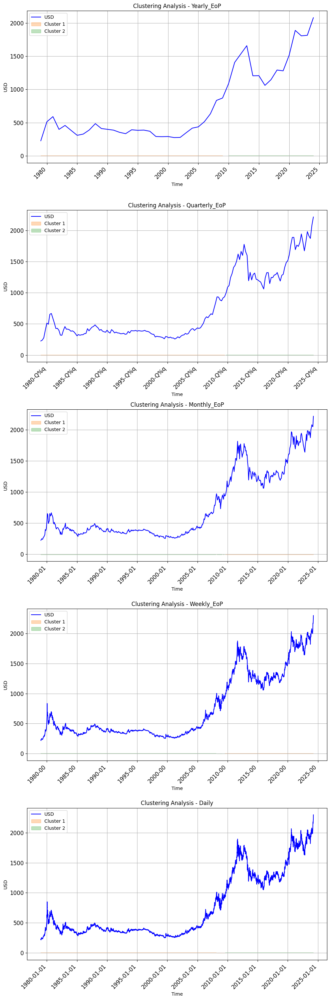

In [ ]:
#
file_path = 'data.xlsx'  # Provide the path to your Excel file here
sheets = ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily'] # Replace with your sheet names
time_levels = ['yearly', 'quarterly', 'monthly', 'weekly', 'daily']    # Specify the time level for each sheet
clustering_analysis(file_path, sheets, time_levels)

### Regrouped on same Figure

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Breakpoints for Yearly_EoP occur on the following dates:
31   2009-12-31
Name: temps, dtype: datetime64[ns]
Breakpoints for Quarterly_EoP occur on the following dates:
123   2009-09-30
Name: temps, dtype: datetime64[ns]


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Breakpoints for Monthly_EoP occur on the following dates:
350   2008-02-29
351   2008-03-31
362   2009-02-27
363   2009-03-31
365   2009-05-29
366   2009-06-30
368   2009-08-31
Name: temps, dtype: datetime64[ns]


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Breakpoints for Weekly_EoP occur on the following dates:
1522   2008-02-29
1525   2008-03-21
1541   2008-07-11
1543   2008-07-25
1573   2009-02-20
1575   2009-03-06
1577   2009-03-20
1578   2009-03-27
1586   2009-05-22
1589   2009-06-12
1595   2009-07-24
1596   2009-07-31
1597   2009-08-07
Name: temps, dtype: datetime64[ns]


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Breakpoints for Daily occur on the following dates:
7608   2008-02-27
7624   2008-03-20
7628   2008-03-26
7630   2008-03-28
7644   2008-04-17
7645   2008-04-18
7705   2008-07-11
7713   2008-07-23
7862   2009-02-17
7869   2009-02-26
7870   2009-02-27
7871   2009-03-02
7884   2009-03-19
7887   2009-03-24
7930   2009-05-22
7932   2009-05-26
7933   2009-05-27
7941   2009-06-08
7942   2009-06-09
7945   2009-06-12
7971   2009-07-20
7977   2009-07-28
7981   2009-08-03
7986   2009-08-10
7988   2009-08-12
7991   2009-08-17
7995   2009-08-21
7998   2009-08-26
8000   2009-08-28
Name: temps, dtype: datetime64[ns]


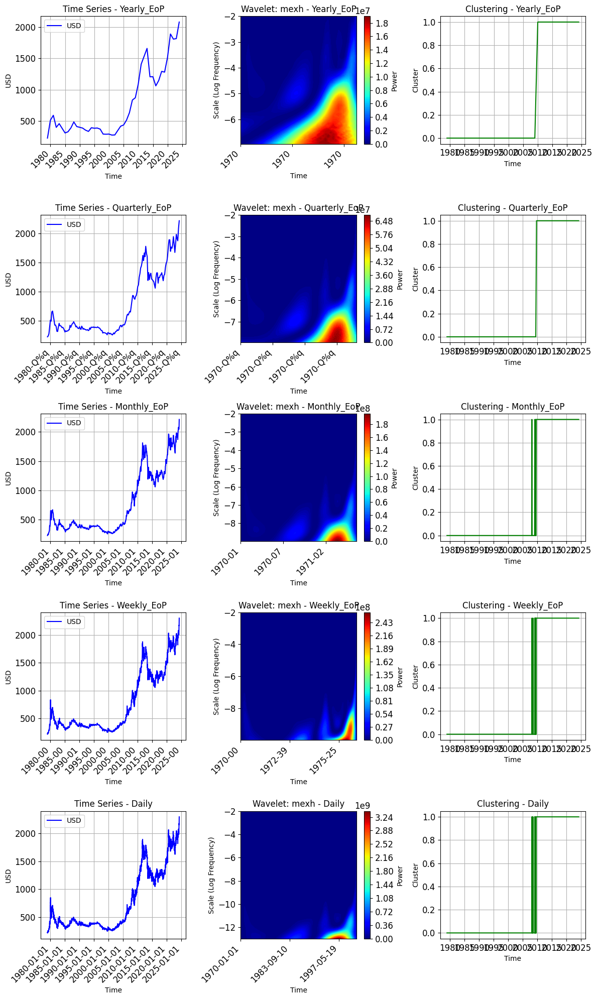

In [ ]:
# Assuming unified_wavelet_clustering_analysis is already defined and necessary imports are done

# Define the file path and sheet details
file_path = 'data.xlsx'
sheets = ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily'] # Replace with your sheet names
time_levels =  ['yearly', 'quarterly', 'monthly', 'weekly', 'daily']    # Specify the time level for each sheet
wavelet_type = ['mexh']  # You can also try 'morl', 'mexh', 'cmor1.5-1.0', etc.
n_clusters = 2  # Number of clusters for KMeans

# Apply the function to analyze and visualize the data
unified_wavelet_clustering_analysis(file_path, sheets, time_levels, wavelet_type, n_clusters)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` ex

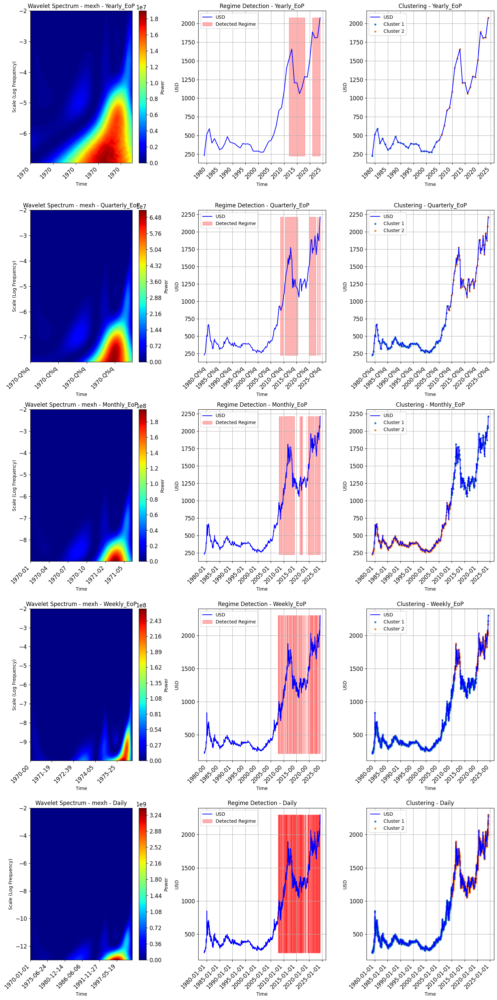

In [ ]:
file_path = 'data.xlsx'
sheets = ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily'] # Replace with your sheet names
time_levels = ['yearly', 'quarterly', 'monthly', 'weekly', 'daily']    # Specify the time level for each sheet
wavelet_types = 'mexh'  # You can also try 'morl', 'mexh', 'cmor1.5-1.0', etc.
n_clusters = 2  # Set the number of clusters you want

unified_wavelet_clustering_analysis_a(file_path, sheets, time_levels, wavelet_types, n_clusters)


## Descriptive statistics

In [ ]:
# Load the Excel file
file_path = 'data.xlsx'  # Provide the path to your Excel file here
file_path_1970 = 'data-1970.xlsx'  # Provide the path to your Excel file here
file_path_2010 = 'data-2010.xlsx'  # Provide the path to your Excel file here
sheets_to_read = ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataframes = read_excel_sheets(file_path, sheets_to_read)
dataframes_79 = read_excel_sheets(file_path_1970, sheets_to_read)
dataframes_10 = read_excel_sheets(file_path_2010, sheets_to_read)

In [ ]:
# Example usage
sheets_to_read = ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']

# Assuming your three data dictionaries are dataframes, dataframes_79, and dataframes_10
data_dicts = {
    'dataframes': dataframes,
    'dataframes_79': dataframes_79,
    'dataframes_10': dataframes_10
}

# Calculate descriptive statistics
descriptive_stats_df = calculate_descriptive_statistics(data_dicts, sheets_to_read)

# Display the table
descriptive_stats_df


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11811.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 8090.
  res = hypotest_fun_out(*samples, **kwds)


Sheet                                  Daily Monthly_EoP Quarterly_EoP  \
                    DataFrame                                            
Mean                dataframes       763.267     762.858       761.613   
                    dataframes_10   1495.402    1495.499      1491.774   
                    dataframes_79    426.521     426.983        428.66   
Min                 dataframes        216.85       226.0         226.0   
                    dataframes_10     1049.4      1060.0        1060.0   
                    dataframes_79     216.85       226.0         226.0   
Max                 dataframes       2298.55     2214.35       2214.35   
                    dataframes_10    2298.55     2214.35       2214.35   
                    dataframes_79     1212.5     1175.75        1087.5   
Std                 dataframes       538.859     539.508       538.532   
                    dataframes_10    281.804     284.648       288.037   
                    dataframes_79     165.63     167.291       170.413   
Observations        dataframes         11811         544           182   
                    dataframes_10       3721         171            57   
                    dataframes_79       8090         373           125   
Normality (p-value) dataframes     0.000 ***   0.000 ***     0.000 ***   
                    dataframes_10  0.000 ***   0.000 ***     0.003 ***   
                    dataframes_79  0.000 ***   0.000 ***     0.000 ***   

Sheet                             Weekly_EoP Yearly_EoP  
                    DataFrame                            
Mean                dataframes       763.456    759.127  
                    dataframes_10   1495.309   1491.482  
                    dataframes_79    426.478    438.722  
Min                 dataframes         217.6      226.0  
                    dataframes_10     1057.4     1060.0  
                    dataframes_79      217.6      226.0  
Max                 dataframes       2298.55     2078.4  
                    dataframes_10    2298.55     2078.4  
                    dataframes_79    1190.25     1087.5  
Std                 dataframes       539.129    541.064  
                    dataframes_10    282.875    315.732  
                    dataframes_79    165.417    186.988  
Observations        dataframes          2363         46  
                    dataframes_10        745         14  
                    dataframes_79       1618         32  
Normality (p-value) dataframes     0.000 ***  0.000 ***  
                    dataframes_10  0.000 ***      0.467  
                    dataframes_79  0.000 ***  0.000 ***

## Stationarity

The ADF test checks the null hypothesis that a unit root is present in a time series sample. If the test statistic is less than the critical value, you can reject the null hypothesis and conclude that the series is stationary.

<ipython-input-35-c45794d4da5e>:7: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  result = kpss(timeseries, regression='c')
<ipython-input-35-c45794d4da5e>:7: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result = kpss(timeseries, regression='c')
<ipython-input-35-c45794d4da5e>:7: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  result = kpss(timeseries, regression='c')
<ipython-input-35-c45794d4da5e>:7: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  result = kpss(timeseries, regression='c')
<ipython-input-3

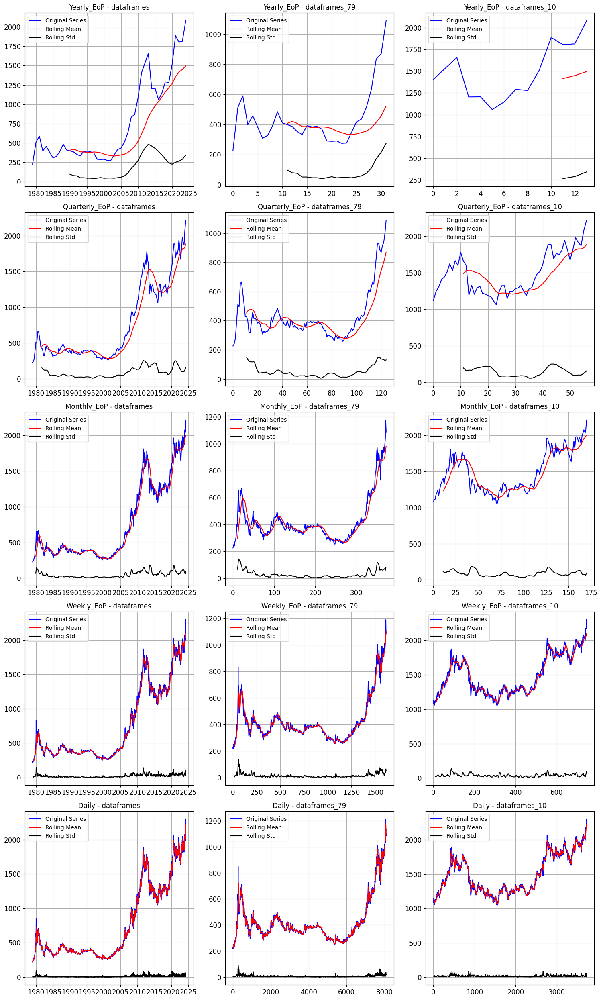

Sheet,Yearly_EoP,Quarterly_EoP,Monthly_EoP,Weekly_EoP,Daily
dataframes ADF Statistic,0.643,0.915,0.732,0.930,1.072
dataframes ADF p-value,0.989,0.993,0.990,0.993,0.995
dataframes KPSS Statistic,0.813,1.493,2.665,6.000,12.890
dataframes KPSS p-value,0.010 ***,0.010 ***,0.010 ***,0.010 ***,0.010 ***
dataframes_79 ADF Statistic,-3.626,1.562,2.138,0.492,0.600
dataframes_79 ADF p-value,0.005 ***,0.998,0.999,0.985,0.988
dataframes_79 KPSS Statistic,0.320,0.517,0.796,1.389,3.203
dataframes_79 KPSS p-value,0.100 *,0.038 **,0.010 ***,0.010 ***,0.010 ***
dataframes_10 ADF Statistic,-3.428,-0.706,-0.697,-0.593,-0.425
dataframes_10 ADF p-value,0.010 **,0.845,0.848,0.873,0.906


In [ ]:
# Analyze stationarity and save images
results_df = analyze_stationarity(dataframes, dataframes_79, dataframes_10)
results_df

## Saisonality

To check for seasonality in your time series data, you can follow these steps:

    Plot the Time Series: Visual inspection is often the first step to identify seasonality.

    Seasonal Decomposition: Use statistical methods like STL (Seasonal-Trend decomposition using LOESS) or classical decomposition to separate the time series into trend, seasonal, and residual components.

    Autocorrelation Function (ACF): Analyze the autocorrelation function to identify repeating patterns in the data.

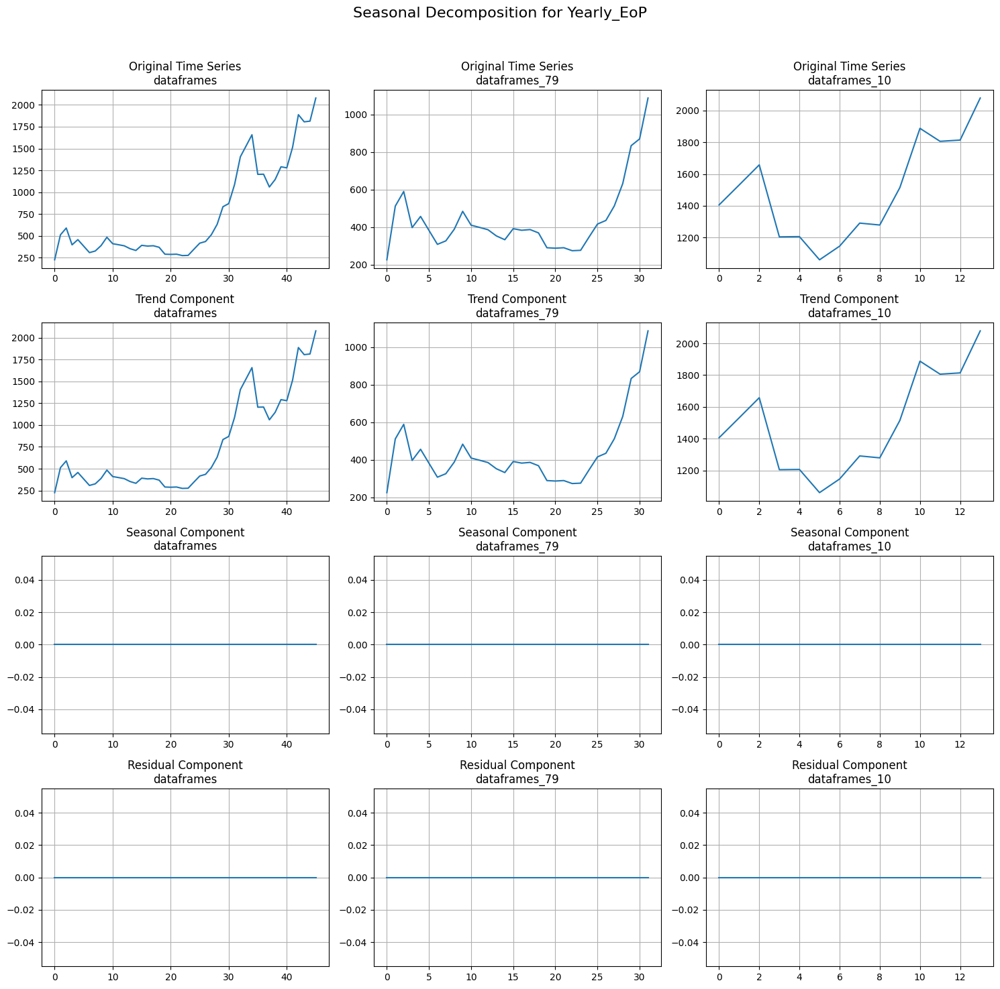

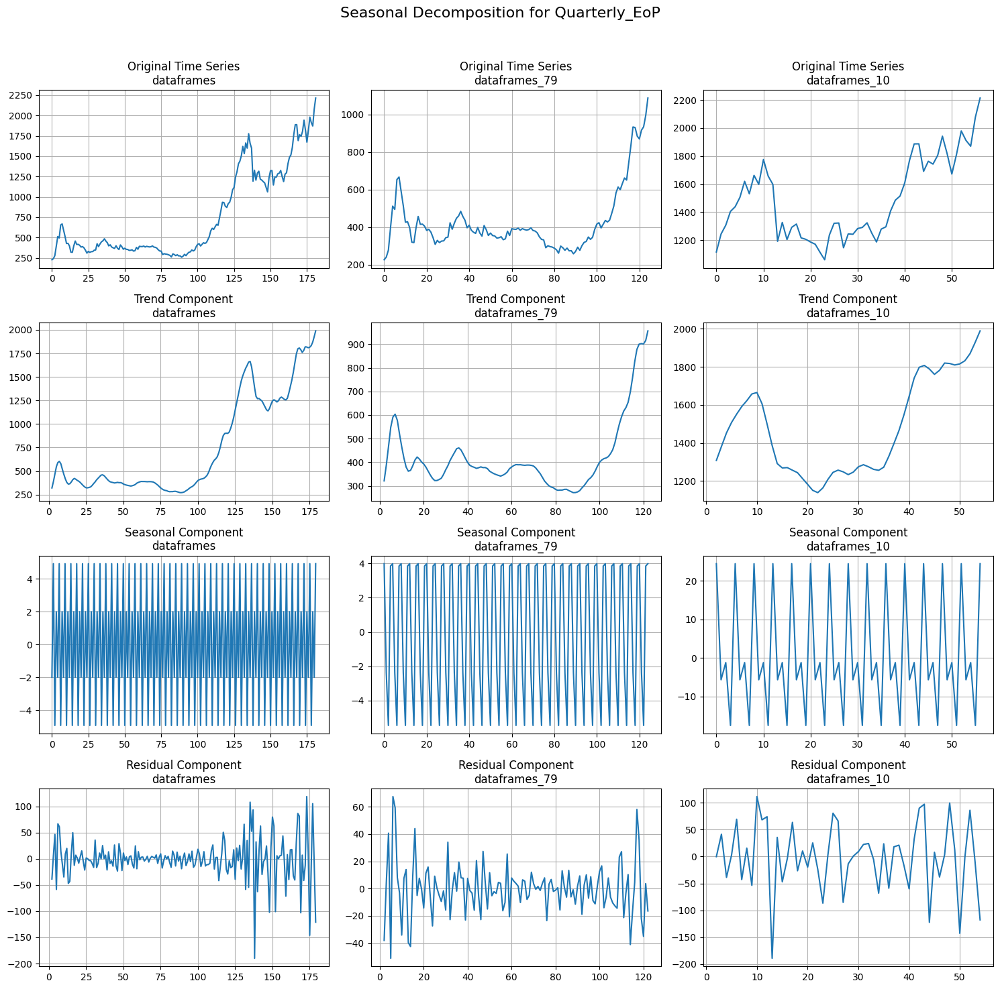

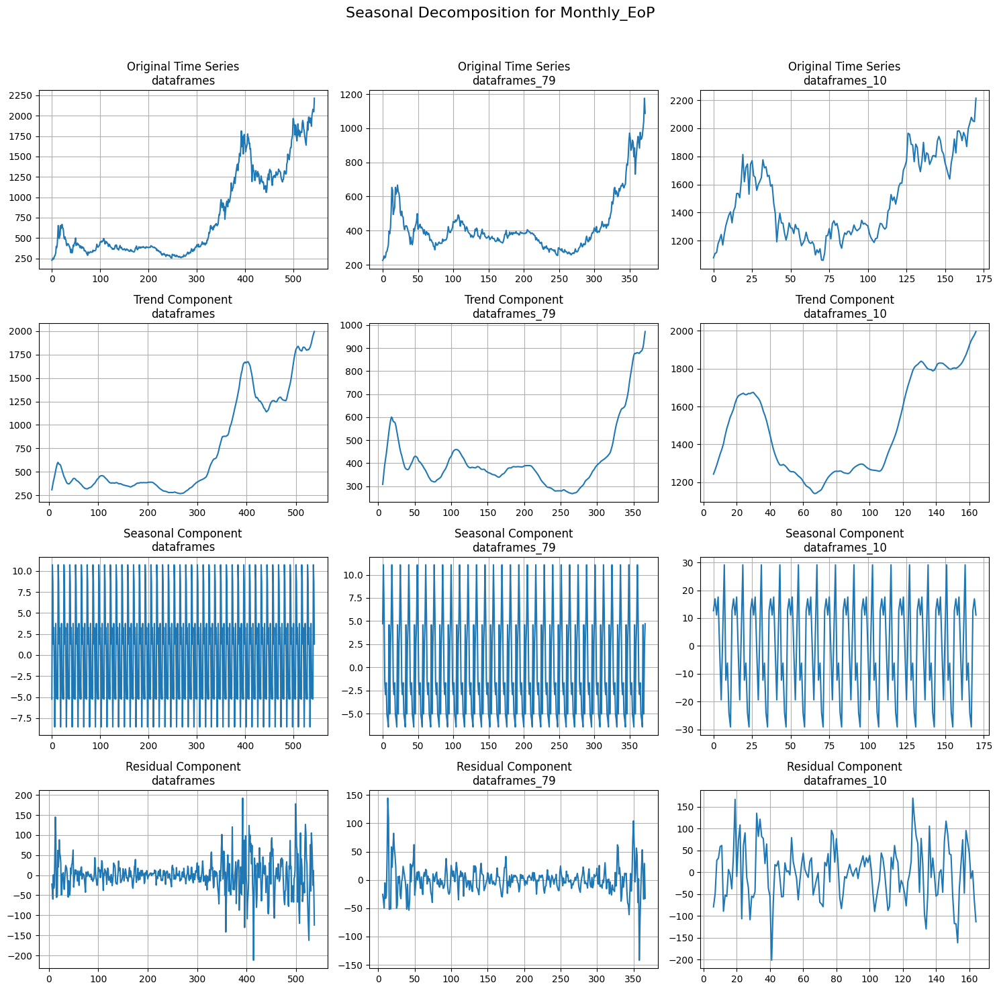

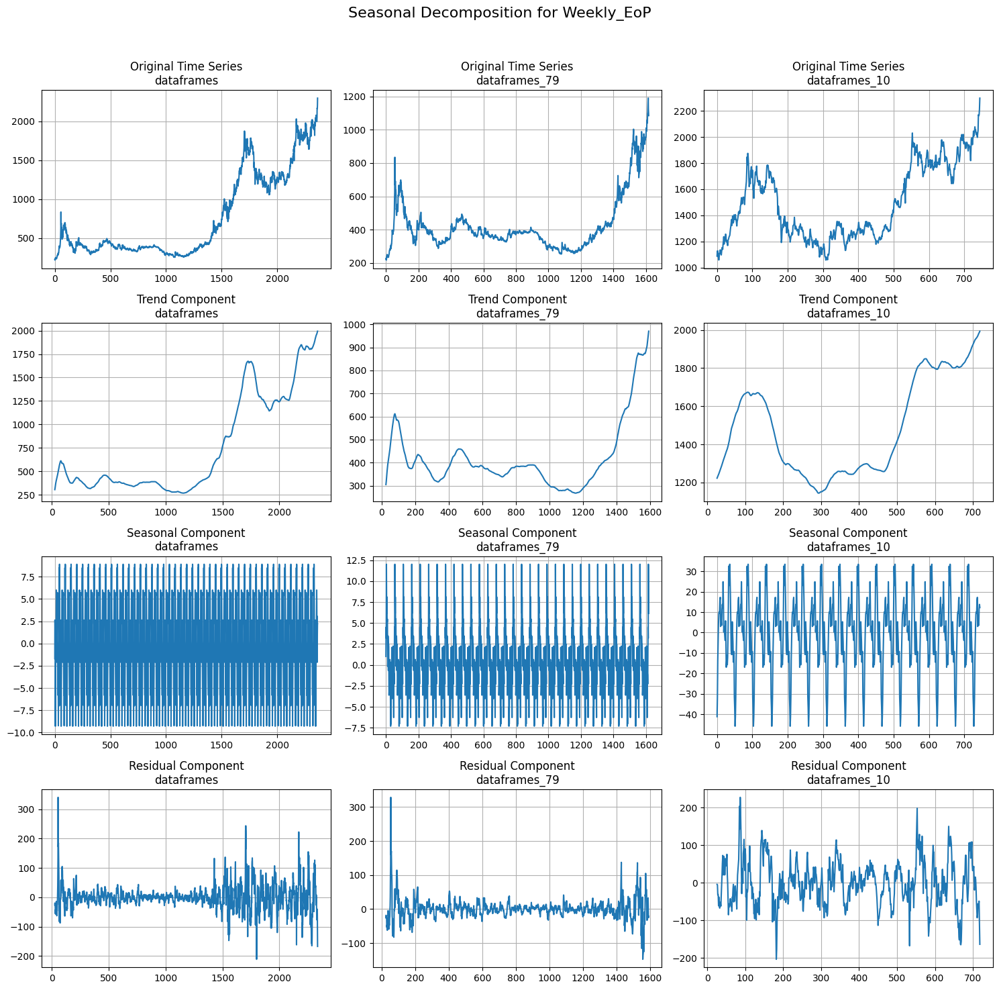

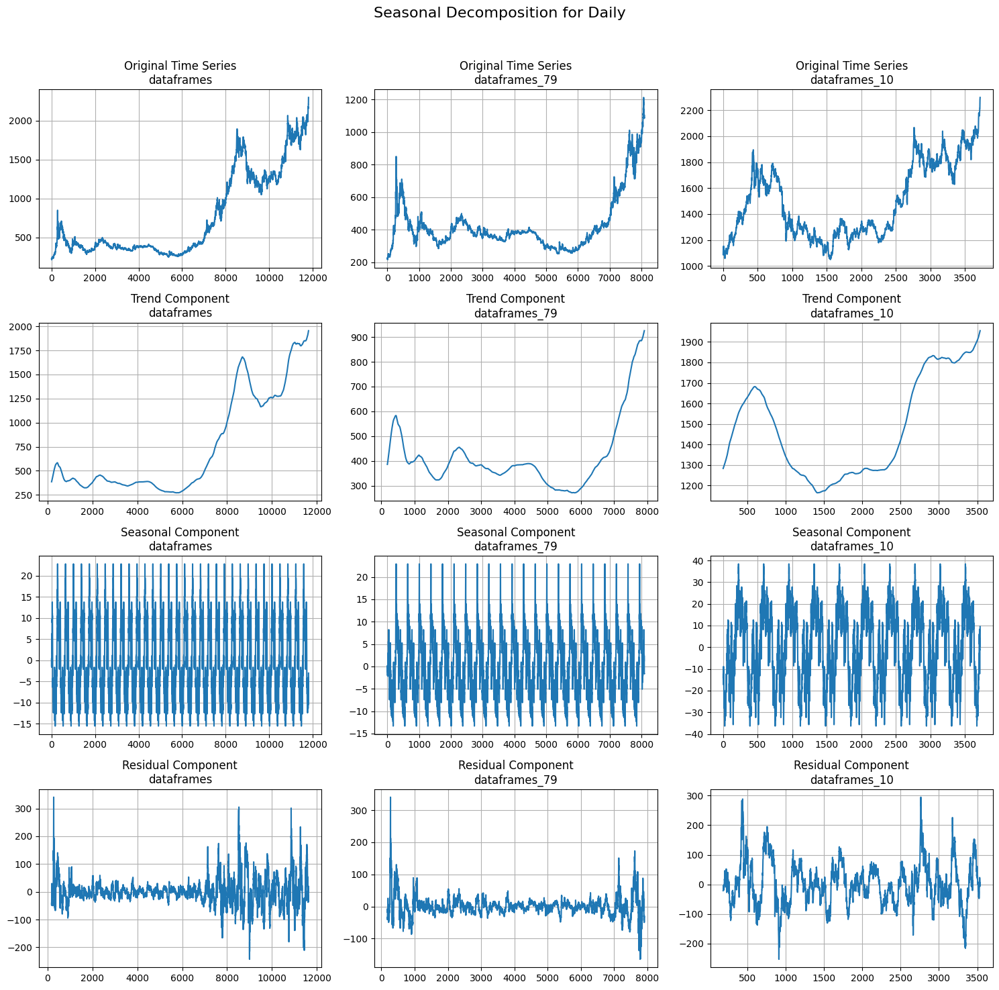

In [ ]:
period_dict = {
    'Yearly_EoP': 1,  # No seasonality expected in yearly data
    'Quarterly_EoP': 4,
    'Monthly_EoP': 12,
    'Weekly_EoP': 52,
    'Daily': 365
}

# Analyze seasonality
analyze_seasonality(dataframes, dataframes_79, dataframes_10, period_dict)


## ARIMA and SARIMA selection

### ARIMA / SARIMA selection

In [ ]:
# Example Usage:
# Assuming dataframes, dataframes_79, dataframes_10 are dictionaries where keys are sheet names and values are time series data
sheets_to_read = ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP']
data_dict = {
    'dataframes': dataframes,
    'dataframes_79': dataframes_79,
    'dataframes_10': dataframes_10
}

results_df = arima_sarima_analysis(data_dict, sheets_to_read)

results_df

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/loc

ARIMA Order    ARIMA AIC SARIMA Order  \
Dataframe     Sheet                                                 
dataframes    Yearly_EoP      (1, 0, 0)   597.790062         None   
              Quarterly_EoP   (1, 0, 0)  2082.096169    (1, 0, 1)   
              Monthly_EoP     (1, 0, 1)  5721.202837    (1, 0, 1)   
dataframes_79 Yearly_EoP      (1, 0, 0)   391.567664         None   
              Quarterly_EoP   (1, 0, 1)  1272.721555    (1, 0, 1)   
              Monthly_EoP     (1, 0, 0)  3564.790839    (1, 0, 1)   
dataframes_10 Yearly_EoP      (1, 0, 0)   194.786858         None   
              Quarterly_EoP   (1, 0, 0)   710.133523    (1, 0, 1)   
              Monthly_EoP     (1, 0, 1)  1951.335496    (1, 0, 1)   

                            SARIMA Seasonal Order   SARIMA AIC  
Dataframe     Sheet                                             
dataframes    Yearly_EoP                     None          inf  
              Quarterly_EoP          (0, 0, 1, 4)  1998.496331  
              Monthly_EoP           (0, 0, 1, 12)  5556.245255  
dataframes_79 Yearly_EoP                     None          inf  
              Quarterly_EoP          (0, 0, 1, 4)  1187.985001  
              Monthly_EoP           (1, 0, 1, 12)  3379.654665  
dataframes_10 Yearly_EoP                     None          inf  
              Quarterly_EoP          (0, 0, 1, 4)   635.117353  
              Monthly_EoP           (1, 0, 1, 12)  1786.401990

### ARCH / GARCH selection

In [ ]:
# Example usage
data_dicts = {
    'dataframes': dataframes,
    'dataframes_79': dataframes_79,
    'dataframes_10': dataframes_10
}

sheets_to_read = ['Weekly_EoP', 'Daily']
results_df = arch_garch_analysis(data_dicts, sheets_to_read)
results_df


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 2.905e+05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 0.1 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 2.905e+05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 0.1 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarn

# Sampling

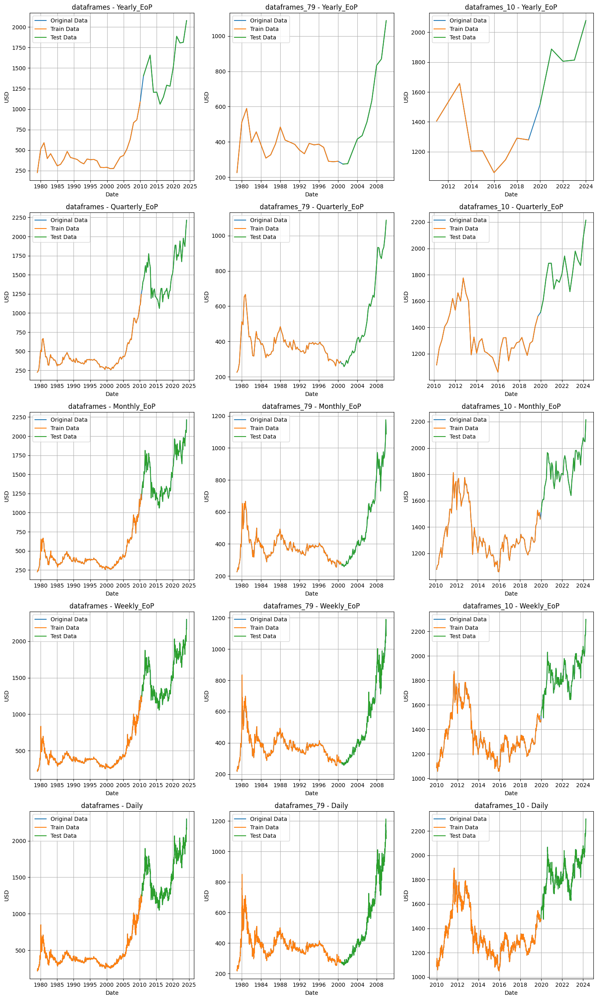

In [ ]:
# Example usage
data_dicts = {
    'dataframes': dataframes,
    'dataframes_79': dataframes_79,
    'dataframes_10': dataframes_10
}

sheets_to_read = ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
plot_data_splits(data_dicts, sheets_to_read, filename='data_splits.jpeg')


# Training Models

In [ ]:
data_dicts = {
    'dataframes': dataframes,  # Replace with your actual data
    'dataframes_79': dataframes_79,  # Replace with your actual data
    'dataframes_10': dataframes_10  # Replace with your actual data
}

## ARIMA training modeel

In [ ]:
# Example usage with your actual data
sheets_to_read = ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP']  # List of sheets

arima_params = {
    'dataframes': {
        'Yearly_EoP': {'order': (1, 0, 0), 'seasonal_order': (0, 0, 0, 0)},
        'Quarterly_EoP': {'order': (1, 0, 0), 'seasonal_order': (0, 0, 0, 0)},
        'Monthly_EoP': {'order': (1, 0, 1), 'seasonal_order': (0, 0, 0, 0)},
    },
    'dataframes_79': {
        'Yearly_EoP': {'order': (1, 0, 0), 'seasonal_order': (0, 0, 0, 0)},
        'Quarterly_EoP': {'order': (1, 0, 1), 'seasonal_order': (0, 0, 0, 0)},
        'Monthly_EoP': {'order': (1, 0, 0), 'seasonal_order': (0, 0, 0, 0)},
    },
    'dataframes_10': {
        'Yearly_EoP': {'order': (1, 0, 0), 'seasonal_order': (0, 0, 0, 0)},
        'Quarterly_EoP': {'order': (1, 0, 0), 'seasonal_order': (0, 0, 0, 0)},
        'Monthly_EoP': {'order': (1, 0, 1), 'seasonal_order': (0, 0, 0, 0)},
    }
}

In [ ]:
#
run_arima(data_dicts, arima_params, sheets_to_read)

## SARIMA training model

In [ ]:
# Example usage with your actual data
sheets_to_read = ['Quarterly_EoP', 'Monthly_EoP']  # List of sheets

sarima_params = {
    'dataframes': {
        'Quarterly_EoP': {'order': (1, 0, 1), 'seasonal_order': (0, 0, 1, 4)},
        'Monthly_EoP': {'order': (1, 0, 1), 'seasonal_order': (0, 0, 1, 12)},
    },
    'dataframes_79': {
        'Quarterly_EoP': {'order': (1, 0, 1), 'seasonal_order': (0, 0, 1, 4)},
    #    'Monthly_EoP': {'order': (1, 0, 1), 'seasonal_order': (1, 0, 1, 12)},
    },
    'dataframes_10': {
        'Quarterly_EoP': {'order': (1, 0, 1), 'seasonal_order': (0, 0, 1, 4)},
        'Monthly_EoP': {'order': (1, 0, 1), 'seasonal_order': (1, 0, 1, 12)},
    }
}

In [ ]:
#
run_sarima(data_dicts, sarima_params, sheets_to_read)

## ARCH/GARCH training model

In [ ]:
#
sheets_to_read = ['Weekly_EoP', 'Daily']

garch_params = {
    'dataframes': {
        'Weekly_EoP': {'p': 1, 'q': 2},
        'Daily': {'p': 1, 'q': 2},
    },
    'dataframes_79': {
        'Weekly_EoP': {'p': 1, 'q': 2},
        'Daily': {'p': 1, 'q': 2},
    },
    'dataframes_10': {
        'Weekly_EoP': {'p': 1, 'q': 1},
        'Daily': {'p': 1, 'q': 0},
    }
}

In [ ]:
run_arch(data_dicts, garch_params, sheets_to_read, train_ratio=0.7)

## CNN fiting and optimizer

### Optimizer parameters

In [ ]:
# Prepare your data
Y = dataframes_10["Yearly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes_10" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Yearly_EoP"
n_steps = 1
max_epochs = 81
factor = 3

best_hyperparameters, best_model = tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

In [ ]:
# Prepare your data
Y = dataframes_10["Quarterly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes_10" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Quarterly_EoP"
n_steps = 4
max_epochs = 50
factor = 3

best_hyperparameters, best_model = tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

Trial 64 Complete [00h 00m 01s]

Best val_loss So Far: 13685.01953125
Total elapsed time: 00h 02m 58s


In [ ]:
# Prepare your data
Y = dataframes_10["Monthly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes_10" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Monthly_EoP"
n_steps = 12
max_epochs = 50
factor = 3

best_hyperparameters, best_model = tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

Trial 90 Complete [00h 00m 08s]
val_loss: 13127.5556640625

Best val_loss So Far: 10269.166015625
Total elapsed time: 00h 06m 27s


In [ ]:
# Prepare your data
Y = dataframes_10["Weekly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes_10" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Weekly_EoP"
n_steps = 58
max_epochs = 50
factor = 3

best_hyperparameters, best_model = tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

Trial 90 Complete [00h 00m 18s]
val_loss: 6228.79248046875

Best val_loss So Far: 3207.608642578125
Total elapsed time: 00h 10m 59s


In [ ]:
# Prepare your data
Y = dataframes_10["Daily"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes_10" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Daily"
n_steps = 365
max_epochs = 50
factor = 3

best_hyperparameters, best_model = tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

Trial 90 Complete [00h 04m 07s]
val_loss: 1417.5107421875

Best val_loss So Far: 1062.1781005859375
Total elapsed time: 01h 07m 34s


In [ ]:
# Prepare your data
Y = dataframes_79["Yearly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes_79" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Yearly_EoP"
n_steps = 1
max_epochs = 50
factor = 3

best_hyperparameters, best_model = tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

In [ ]:
# Prepare your data
Y = dataframes_79["Quarterly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes_79" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Quarterly_EoP"
n_steps = 4
max_epochs = 50
factor = 3

best_hyperparameters, best_model = tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

In [ ]:
# Prepare your data
Y = dataframes_79["Monthly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes_79" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Monthly_EoP"
n_steps = 12
max_epochs = 50
factor = 3

best_hyperparameters, best_model = tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

Trial 90 Complete [00h 00m 14s]
val_loss: 171.42193603515625

Best val_loss So Far: 137.81109619140625
Total elapsed time: 00h 12m 03s


In [ ]:
# Prepare your data
Y = dataframes_79["Weekly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes_79" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Weekly_EoP"
n_steps = 58
max_epochs = 50
factor = 3

best_hyperparameters, best_model = tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

Trial 90 Complete [00h 00m 23s]
val_loss: 70.93072509765625

Best val_loss So Far: 48.44771194458008
Total elapsed time: 00h 18m 23s


In [ ]:
# Prepare your data
Y = dataframes_79["Daily"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes_79" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Daily"
n_steps = 365
max_epochs = 50
factor = 3

best_hyperparameters, best_model = tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

Trial 90 Complete [00h 14m 32s]
val_loss: 39.980796813964844

Best val_loss So Far: 15.608105659484863
Total elapsed time: 01h 58m 17s


In [ ]:
# Prepare your data
Y = dataframes["Yearly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Yearly_EoP"
n_steps = 1
max_epochs = 50
factor = 3

best_hyperparameters, best_model = tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

In [ ]:
# Prepare your data
Y = dataframes["Quarterly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Quarterly_EoP"
n_steps = 4
max_epochs = 50
factor = 3

best_hyperparameters, best_model = tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

In [ ]:
# Prepare your data
Y = dataframes["Monthly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Monthly_EoP"
n_steps = 12
max_epochs = 50
factor = 3

best_hyperparameters, best_model = tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

Trial 90 Complete [00h 00m 17s]
val_loss: 5847.9169921875

Best val_loss So Far: 5847.9169921875
Total elapsed time: 00h 16m 08s


In [ ]:
# Prepare your data
Y = dataframes["Weekly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Weekly_EoP"
n_steps = 58
max_epochs = 50
factor = 3

best_hyperparameters, best_model = tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

Trial 90 Complete [00h 00m 16s]
val_loss: 2848.239501953125

Best val_loss So Far: 1362.8828125
Total elapsed time: 00h 09m 04s


In [ ]:
# Prepare your data
Y = dataframes["Daily"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Daily"
n_steps = 365
max_epochs = 50
factor = 3

best_hyperparameters, best_model = tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

Trial 90 Complete [00h 13m 01s]
val_loss: 610.4259033203125

Best val_loss So Far: 301.00994873046875
Total elapsed time: 03h 03m 55s


In [ ]:
# Define dataset and sheet names
sheet_names = ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_names = ['dataframes', 'dataframes_79', 'dataframes_10']

# Initialize a dictionary to store the data for each combination of dataset and sheet names
data = {}

# Loop over dataset and sheet names to read the corresponding JSON files
for dataset in dataset_names:
    for sheet in sheet_names:
        # Construct the file name
        file_name = f'best_hyperparameters_{dataset}_{sheet}.json'

        if os.path.exists(file_name):
            # Open and read the JSON file
            with open(file_name, 'r') as f:
                json_data = json.load(f)

            # Store the data in the dictionary
            column_name = f'{dataset}_{sheet}'
            data[column_name] = json_data
        else:
            print(f"File {file_name} not found")

# Create a DataFrame from the collected data
df = pd.DataFrame(data)

# Reorganize the DataFrame so that the first column contains the JSON keys
df = df.transpose()  # Transpose so each JSON becomes a column
df.reset_index(inplace=True)  # Convert index to column
df.rename(columns={'index': 'parameter'}, inplace=True)  # Rename index column
df = df.transpose()  # Transpose back to match desired structure
df.columns = df.iloc[0]  # Set first row as header
df_cnn_hyperparameters = df[1:]  # Remove the first row which is now the header

# You can save it as a CSV file
df_cnn_hyperparameters.to_csv('hyperparameters_dataframe.csv', index=False)

# Show the final DataFrame
df_cnn_hyperparameters

parameter,dataframes_Yearly_EoP,dataframes_Quarterly_EoP,dataframes_Monthly_EoP,dataframes_Weekly_EoP,dataframes_Daily,dataframes_79_Yearly_EoP,dataframes_79_Quarterly_EoP,dataframes_79_Monthly_EoP,dataframes_79_Weekly_EoP,dataframes_79_Daily,dataframes_10_Yearly_EoP,dataframes_10_Quarterly_EoP,dataframes_10_Monthly_EoP,dataframes_10_Weekly_EoP,dataframes_10_Daily
filters,96.0,32.0,128.0,64.0,32,96.0,64.0,32,96.0,32,32.0,64.0,96,128,32.0
kernel_size,4.0,2.0,4.0,2.0,4,4.0,2.0,2,2.0,5,5.0,4.0,2,2,3.0
dense_units,50.0,50.0,50.0,100.0,100,50.0,50.0,50,100.0,100,100.0,50.0,100,50,50.0
learning_rate,0.001874,0.005256,0.004243,0.001751,0.000364,0.002817,0.005811,0.001624,0.001377,0.000362,0.008402,0.00974,0.001606,0.00048,0.000297
tuner/epochs,2.0,2.0,50.0,50.0,50,2.0,6.0,50,50.0,50,3.0,17.0,50,50,50.0
tuner/initial_epoch,0.0,0.0,0.0,0.0,17,0.0,2.0,17,0.0,17,0.0,0.0,17,17,0.0
tuner/bracket,3.0,3.0,0.0,0.0,2,3.0,3.0,3,0.0,2,2.0,1.0,3,2,0.0
tuner/round,0.0,0.0,0.0,0.0,2,0.0,1.0,3,0.0,2,0.0,0.0,3,2,0.0
tuner/trial_id,NaN,NaN,NaN,NaN,0067,NaN,NaN,0046,NaN,0067,NaN,NaN,0046,0067,NaN


### Forecasting CNN

In [ ]:
# ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']

cnn_fit_and_forecast(data_var=data_10_Yearly_EoP, seq_length=1, n_steps=9, ratio_split=0.7,
                     output_file='tesssy.xlsx')

## LSTM fiting and optimizer

### Optimizer parameters

In [ ]:
# Prepare your data
Y = dataframes_10["Yearly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes_10" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Yearly_EoP"
n_steps = 1
max_epochs = 81
factor = 3

best_hyperparameters, best_model = lstm_tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

Trial 5 Complete [00h 00m 04s]
val_loss: 3256137.0

Best val_loss So Far: 2787904.0
Total elapsed time: 00h 00m 20s


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 2 variables whereas the saved optimizer has 7 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
# Prepare your data
Y = dataframes_10["Quarterly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes_10" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Quarterly_EoP"
n_steps = 4
max_epochs = 81
factor = 3

best_hyperparameters, best_model = lstm_tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

Reloading Tuner from lstm_tuning/lstm/tuner0.json


In [ ]:
# Prepare your data
Y = dataframes_79["Monthly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes_79" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Monthly_EoP"
n_steps = 12
max_epochs = 81
factor = 3

best_hyperparameters, best_model = lstm_tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

Reloading Tuner from lstm_tuning/lstm/tuner0.json


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 2 variables whereas the saved optimizer has 7 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
# Prepare your data
Y = dataframes_79["Quarterly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes_79" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Quarterly_EoP"
n_steps = 4
max_epochs = 81
factor = 3

best_hyperparameters, best_model = lstm_tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

Reloading Tuner from lstm_tuning/lstm/tuner0.json


In [ ]:
# Prepare your data
Y = dataframes_79["Yearly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes_79" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Yearly_EoP"
n_steps = 1
max_epochs = 81
factor = 3

best_hyperparameters, best_model = lstm_tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

Reloading Tuner from lstm_tuning/lstm/tuner0.json


In [ ]:
# Prepare your data
Y = dataframes["Yearly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Yearly_EoP"
n_steps = 1
max_epochs = 81
factor = 3

best_hyperparameters, best_model = lstm_tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

Reloading Tuner from lstm_tuning/lstm/tuner0.json


In [ ]:
# Prepare your data
Y = dataframes["Quarterly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Quarterly_EoP"
n_steps = 4
max_epochs = 81
factor = 3

best_hyperparameters, best_model = lstm_tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

Reloading Tuner from lstm_tuning/lstm/tuner0.json


In [ ]:
# Prepare your data
Y = dataframes["Monthly_EoP"]["USD"].values # ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataset_name = "dataframes" # dataframes , dataframes_79 , dataframes_10
sheet_name = "Monthly_EoP"
n_steps = 12
max_epochs = 81
factor = 3

best_hyperparameters, best_model = lstm_tune_hyperparameters(Y, n_steps, dataset_name, sheet_name, max_epochs, factor)

Reloading Tuner from lstm_tuning/lstm/tuner0.json


In [ ]:
# Define dataset and sheet names
sheet_names = ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP']
dataset_names = ['dataframes', 'dataframes_79', 'dataframes_10']

# Initialize a dictionary to store the data for each combination of dataset and sheet names
data = {}

# Loop over dataset and sheet names to read the corresponding JSON files
for dataset in dataset_names:
    for sheet in sheet_names:
        # Construct the file name
        file_name = f'best_hyperparameters_{dataset}_{sheet}.json'

        if os.path.exists(file_name):
            # Open and read the JSON file
            with open(file_name, 'r') as f:
                json_data = json.load(f)

            # Store the data in the dictionary
            column_name = f'{dataset}_{sheet}'
            data[column_name] = json_data
        else:
            print(f"File {file_name} not found")

# Create a DataFrame from the collected data
df = pd.DataFrame(data)

# Reorganize the DataFrame so that the first column contains the JSON keys
df = df.transpose()  # Transpose so each JSON becomes a column
df.reset_index(inplace=True)  # Convert index to column
df.rename(columns={'index': 'parameter'}, inplace=True)  # Rename index column
df = df.transpose()  # Transpose back to match desired structure
df.columns = df.iloc[0]  # Set first row as header
df_cnn_hyperparameters = df[1:]  # Remove the first row which is now the header

# You can save it as a CSV file
df_cnn_hyperparameters.to_csv('hyperparameters_dataframe.csv', index=False)

# Show the final DataFrame
df_cnn_hyperparameters

parameter,dataframes_Yearly_EoP,dataframes_Quarterly_EoP,dataframes_Monthly_EoP,dataframes_79_Yearly_EoP,dataframes_79_Quarterly_EoP,dataframes_79_Monthly_EoP,dataframes_10_Yearly_EoP,dataframes_10_Quarterly_EoP,dataframes_10_Monthly_EoP
units,32,32,32,32,32,32,32,32,32
optimizer,rmsprop,rmsprop,rmsprop,rmsprop,rmsprop,rmsprop,rmsprop,rmsprop,rmsprop


### Forecasting LSTM

In [ ]:
# ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
lstm_fit_and_forecast(data_var=data_79_Weekly_EoP, seq_length=4, n_steps=9, ratio_split=0.7,
                     output_file='lstm_data_79_W.xlsx')

## Wavelet-CNN-LSTM

In [ ]:

# 1. Wavelet Decomposition
def wavelet_decomposition(data, wavelet='db1', level=6):
    """ Perform wavelet decomposition and ensure consistent output length """
    coeffs = pywt.wavedec(data, wavelet, level=level)
    return coeffs[0]  # Approximation coefficients

# 2. Wavelet Reconstruction
def wavelet_reconstruction(coeffs, wavelet='coif6'):
    """ Perform wavelet reconstruction """
    return pywt.waverec([coeffs, None], wavelet)

# 3. Forecasting Function
def wave_cnn_lstm_forecasting(data, seq_length=24, n_steps=5, test_size=0.3, epochs=100, batch_size=16, wavelet='db1', level=6, output_file="forecast_results.xlsx"):
    # 1. Preprocess data
    df = data.copy()
    df.set_index('temps', inplace=True)
    scaler = MinMaxScaler()
    df_scaled = scaler.fit_transform(df)

    # 2. Convert to supervised learning problem
    def create_dataset(data, time_steps=1):
        X, y = [], []
        for i in range(len(data) - time_steps):
            X.append(data[i:i + time_steps])
            y.append(data[i + time_steps])
        return np.array(X), np.array(y)

    X, y = create_dataset(df_scaled, seq_length)

    # Apply wavelet decomposition to the input data outside the Keras model
    X_wavelet = np.array([wavelet_decomposition(seq) for seq in X])

    print(f"Shape after wavelet decomposition: {X_wavelet.shape}")

    # Handle the case where wavelet decomposition changes the sequence length
    X_wavelet_padded = pad_sequences(X_wavelet, maxlen=seq_length, dtype='float32', padding='post')

    # Reshape for CNN-LSTM input (samples, time steps, features)
    X_wavelet_padded = X_wavelet_padded.reshape((X_wavelet_padded.shape[0], seq_length, 1))

    # 3. Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X_wavelet_padded, y, test_size=test_size, shuffle=False)

    # 4. Build CNN-LSTM model
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train.shape[1], 1)))
    model.add(MaxPooling1D(pool_size=2))
    model.add(LSTM(32, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')

    # 5. Fit model
    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

    # 6. Multi-step forecasting function
    def multi_step_forecast(model, X_input, n_steps, scaler):
        predictions = []
        input_seq = X_input.copy()

        for step in range(n_steps):
            # Suppress printing by adding verbose=0
            pred = model.predict(input_seq.reshape(1, seq_length, 1), verbose=0)[0]
            predictions.append(pred)
            input_seq = np.append(input_seq[1:], pred)

        # Inverse transform predictions to original scale
        predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

        return predictions


    # 7. Generate 1 to 6 step ahead forecasts and save in DataFrame
    forecast_results = pd.DataFrame()

    # Correct inverse scaling of the forecast results
    y_real = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    forecast_results['y_real'] = y_real  # Add the true values as 'y_real'

    for i in range(1, n_steps + 1):
        y_pred = []
        for j in range(len(X_test)):
            input_seq = X_test[j]
            forecast = multi_step_forecast(model, input_seq, i, scaler)
            y_pred.append(forecast[-1])  # Take the ith step prediction
        forecast_results[f'{i}_step'] = np.array(y_pred).flatten()

    # 8. Save forecast results to Excel
    forecast_results.to_excel(output_file, index=False)

    # 9. Plot all columns of forecast_results
    plt.figure(figsize=(12, 8))
    for column in forecast_results.columns:
        plt.plot(forecast_results.index, forecast_results[column], label=column)

    plt.title('Forecasts for Different Steps')
    plt.xlabel('Index')
    plt.ylabel('Forecasted Value')
    plt.legend()
    plt.grid(True)
    plt.show()

    return forecast_results



/usr/local/lib/python3.10/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Shape after wavelet decomposition: (54, 3, 1)


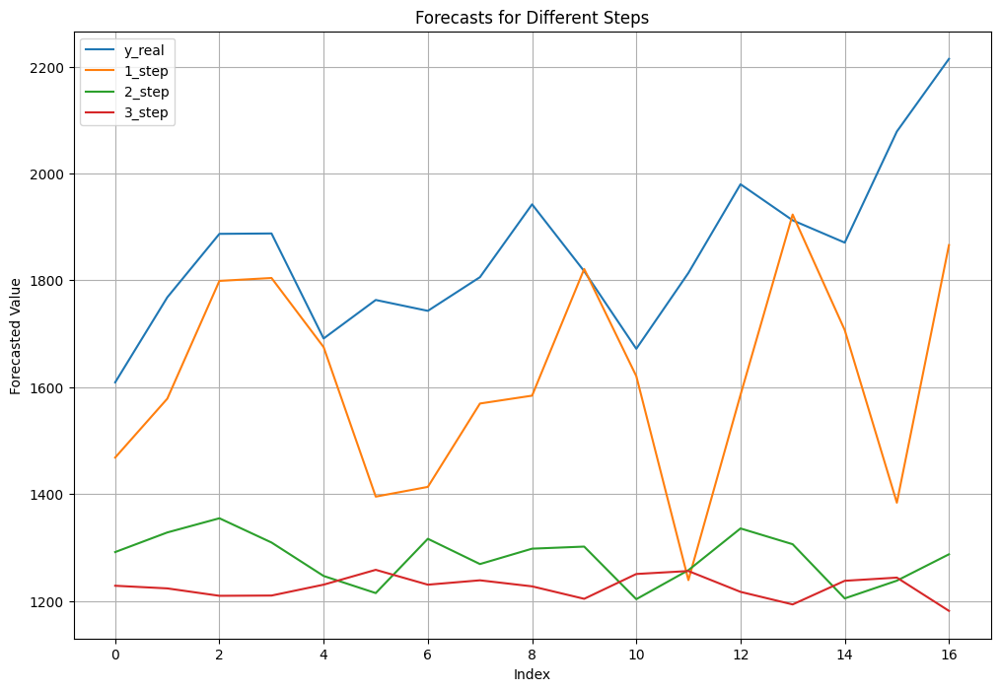

In [ ]:
forecast_results = wave_cnn_lstm_forecasting(
    data=data,          # Your input data as a pandas DataFrame
    seq_length=3,      # The sequence length (look-back period)
    n_steps=3,          # The number of steps to forecast ahead
    test_size=0.3,      # 30% of the data is used for testing
    epochs=200,         # Number of training epochs
    batch_size=8,      # Batch size for model training
    wavelet='bior1.1',
    level=4,
    output_file="w_cnn_lstm_data_10_M.xlsx"  # File to save forecast results
)


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error

# List of wavelets to test
wavelets = ['bior1.1', 'bior1.3', 'bior1.5', 'bior2.2', 'bior2.4', 'bior2.6', 'bior2.8',
            'bior3.1', 'bior3.3', 'bior3.5', 'bior3.7', 'bior3.9', 'bior4.4', 'bior5.5',
            'bior6.8', 'coif1', 'coif2', 'coif3', 'coif4', 'coif5', 'coif6', 'coif7',
            'coif8', 'coif9', 'coif10', 'coif11', 'coif12', 'coif13', 'coif14', 'coif15',
            'coif16', 'coif17', 'db1', 'db2', 'db3', 'db4', 'db5', 'db6', 'db7', 'db8',
            'db9', 'db10', 'db11', 'db12', 'db13', 'db14', 'db15', 'db16', 'db17', 'db18',
            'db19', 'db20', 'db21', 'db22', 'db23', 'db24', 'db25', 'db26', 'db27', 'db28',
            'db29', 'db30', 'db31', 'db32', 'db33', 'db34', 'db35', 'db36', 'db37', 'db38',
            'dmey', 'haar', 'rbio1.1', 'rbio1.3', 'rbio1.5', 'rbio2.2', 'rbio2.4', 'rbio2.6',
            'rbio2.8', 'rbio3.1', 'rbio3.3', 'rbio3.5', 'rbio3.7', 'rbio3.9', 'rbio4.4',
            'rbio5.5', 'rbio6.8', 'sym2', 'sym3', 'sym4', 'sym5', 'sym6', 'sym7', 'sym8',
            'sym9', 'sym10', 'sym11', 'sym12', 'sym13', 'sym14', 'sym15', 'sym16', 'sym17',
            'sym18', 'sym19', 'sym20']

# Dictionary to store the errors for each wavelet
wavelet_errors = {}

for wavelet in wavelets:
    try:
        print(f"Testing wavelet: {wavelet}")

        # Forecast with the current wavelet
        forecast_results = wave_cnn_lstm_forecasting(
            data=data,          # Your input data as a pandas DataFrame
            seq_length=3,       # The sequence length (look-back period)
            n_steps=3,          # The number of steps to forecast ahead
            test_size=0.3,      # 30% of the data is used for testing
            epochs=200,         # Number of training epochs
            batch_size=8,       # Batch size for model training
            wavelet=wavelet,    # Wavelet type to test
            level=4,
            output_file=None    # We won't save to file for this test
        )

        # Compute errors for 1-step, 2-step, and 3-step forecasts
        mse_1_step = mean_squared_error(forecast_results['y_real'], forecast_results['1_step'])
        mse_2_step = mean_squared_error(forecast_results['y_real'], forecast_results['2_step'])
        mse_3_step = mean_squared_error(forecast_results['y_real'], forecast_results['3_step'])

        # Average the errors for all steps
        avg_error = np.mean([mse_1_step, mse_2_step, mse_3_step])

        # Store the average error for the current wavelet
        wavelet_errors[wavelet] = avg_error

    except Exception as e:
        print(f"Error with wavelet {wavelet}: {e}")
        # Continue to the next wavelet without stopping
        continue

# Find the wavelet with the minimum average error
optimal_wavelet = min(wavelet_errors, key=wavelet_errors.get)
print(f"Optimal wavelet: {optimal_wavelet} with error: {wavelet_errors[optimal_wavelet]}")


In [ ]:
# 1. Continuous Wavelet Decomposition
def wavelet_decomposition(data, wavelet='cmor', scales=np.arange(1, 128)):
    """ Perform continuous wavelet decomposition and return the real part of the coefficients """
    coeffs, freqs = pywt.cwt(data, scales, wavelet)
    # Take the average of the absolute values across scales
    return np.mean(np.abs(coeffs), axis=0)

# 2. Forecasting Function
def wave_cnn_lstm_forecasting(data, seq_length=24, n_steps=5, test_size=0.3, epochs=100, batch_size=16, wavelet='cmor', scales=np.arange(1, 128), output_file="forecast_results.xlsx"):
    # 1. Preprocess data
    df = data.copy()
    df.set_index('temps', inplace=True)
    scaler = MinMaxScaler()
    df_scaled = scaler.fit_transform(df)

    # 2. Convert to supervised learning problem
    def create_dataset(data, time_steps=1):
        X, y = [], []
        for i in range(len(data) - time_steps):
            X.append(data[i:i + time_steps])
            y.append(data[i + time_steps])
        return np.array(X), np.array(y)

    X, y = create_dataset(df_scaled, seq_length)

    # Apply continuous wavelet decomposition to the input data outside the Keras model
    X_wavelet = np.array([wavelet_decomposition(seq, wavelet=wavelet, scales=scales) for seq in X])

    print(f"Shape after wavelet decomposition: {X_wavelet.shape}")

    # Handle the case where wavelet decomposition changes the sequence length
    X_wavelet_padded = pad_sequences(X_wavelet, maxlen=seq_length, dtype='float32', padding='post')

    # Reshape for CNN-LSTM input (samples, time steps, features)
    X_wavelet_padded = X_wavelet_padded.reshape((X_wavelet_padded.shape[0], seq_length, 1))

    # 3. Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X_wavelet_padded, y, test_size=test_size, shuffle=False)

    # 4. Build CNN-LSTM model
    model = Sequential()
    model.add(Conv1D(filters=128, kernel_size=2, activation='relu', input_shape=(X_train.shape[1], 1)))
    model.add(MaxPooling1D(pool_size=2))
    model.add(LSTM(32, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')

    # 5. Fit model
    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

    # 6. Multi-step forecasting function
    def multi_step_forecast(model, X_input, n_steps, scaler):
        predictions = []
        input_seq = X_input.copy()

        for step in range(n_steps):
            # Suppress printing by adding verbose=0
            pred = model.predict(input_seq.reshape(1, seq_length, 1), verbose=0)[0]
            predictions.append(pred)
            input_seq = np.append(input_seq[1:], pred)

        # Inverse transform predictions to original scale
        predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

        return predictions

    # 7. Generate 1 to 6 step ahead forecasts and save in DataFrame
    forecast_results = pd.DataFrame()

    # Correct inverse scaling of the forecast results
    y_real = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    forecast_results['y_real'] = y_real  # Add the true values as 'y_real'

    for i in range(1, n_steps + 1):
        y_pred = []
        for j in range(len(X_test)):
            input_seq = X_test[j]
            forecast = multi_step_forecast(model, input_seq, i, scaler)
            y_pred.append(forecast[-1])  # Take the ith step prediction
        forecast_results[f'{i}_step'] = np.array(y_pred).flatten()

    # 8. Save forecast results to Excel
    forecast_results.to_excel(output_file, index=False)

    # 9. Plot all columns of forecast_results
    plt.figure(figsize=(12, 8))
    for column in forecast_results.columns:
        plt.plot(forecast_results.index, forecast_results[column], label=column)

    plt.title('Forecasts for Different Steps')
    plt.xlabel('Index')
    plt.ylabel('Forecasted Value')
    plt.legend()
    plt.grid(True)
    plt.show()

    return forecast_results


In [ ]:
# 1. Continuous Wavelet Decomposition
def wavelet_decomposition(data, wavelet='cmor', scales=np.arange(1, 256)):
    """ Perform continuous wavelet decomposition and return the real part of the coefficients """
    coeffs, freqs = pywt.cwt(data, scales, wavelet)
    # Take the average of the absolute values across scales
    return np.mean(np.abs(coeffs), axis=0)

# 2. Forecasting Function
def wave_cnn_lstm_forecasting(data, seq_length=48, n_steps=9, test_size=0.2, epochs=150, batch_size=32, wavelet='cmor', scales=np.arange(1, 256), output_file="forecast_results.xlsx"):
    # 1. Preprocess data
    df = data.copy()
    df.set_index('temps', inplace=True)
    scaler = MinMaxScaler()
    df_scaled = scaler.fit_transform(df)

    # 2. Convert to supervised learning problem
    def create_dataset(data, time_steps=1):
        X, y = [], []
        for i in range(len(data) - time_steps):
            X.append(data[i:i + time_steps])
            y.append(data[i + time_steps])
        return np.array(X), np.array(y)

    X, y = create_dataset(df_scaled, seq_length)

    # Apply continuous wavelet decomposition to the input data outside the Keras model
    X_wavelet = np.array([wavelet_decomposition(seq, wavelet=wavelet, scales=scales) for seq in X])

    print(f"Shape after wavelet decomposition: {X_wavelet.shape}")

    # Handle the case where wavelet decomposition changes the sequence length
    X_wavelet_padded = pad_sequences(X_wavelet, maxlen=seq_length, dtype='float32', padding='post')

    # Reshape for CNN-LSTM input (samples, time steps, features)
    X_wavelet_padded = X_wavelet_padded.reshape((X_wavelet_padded.shape[0], seq_length, 1))

    # 3. Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X_wavelet_padded, y, test_size=test_size, shuffle=False)

    # 4. Build CNN-LSTM model
    model = Sequential()
    model.add(Conv1D(filters=128, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1)))
    model.add(MaxPooling1D(pool_size=2))
    model.add(LSTM(64, activation='relu', return_sequences=True))
    model.add(Dropout(0.2))  # Adding dropout to prevent overfitting
    model.add(LSTM(32, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')

    # 5. Fit model
    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

    # 6. Multi-step forecasting function
    def multi_step_forecast(model, X_input, n_steps, scaler):
        predictions = []
        input_seq = X_input.copy()

        for step in range(n_steps):
            # Suppress printing by adding verbose=0
            pred = model.predict(input_seq.reshape(1, seq_length, 1), verbose=0)[0]
            predictions.append(pred)
            input_seq = np.append(input_seq[1:], pred)

        # Inverse transform predictions to original scale
        predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

        return predictions

    # 7. Generate 1 to 9 step ahead forecasts and save in DataFrame
    forecast_results = pd.DataFrame()

    # Correct inverse scaling of the forecast results
    y_real = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    forecast_results['y_real'] = y_real  # Add the true values as 'y_real'

    for i in range(1, n_steps + 1):
        y_pred = []
        for j in range(len(X_test)):
            input_seq = X_test[j]
            forecast = multi_step_forecast(model, input_seq, i, scaler)
            y_pred.append(forecast[-1])  # Take the ith step prediction
        forecast_results[f'{i}_step'] = np.array(y_pred).flatten()

    # 8. Save forecast results to Excel
    forecast_results.to_excel(output_file, index=False)

    # 9. Plot all columns of forecast_results
    plt.figure(figsize=(12, 8))
    for column in forecast_results.columns:
        plt.plot(forecast_results.index, forecast_results[column], label=column)

    plt.title('Forecasts for Different Steps')
    plt.xlabel('Index')
    plt.ylabel('Forecasted Value')
    plt.legend()
    plt.grid(True)
    plt.show()

    return forecast_results


In [ ]:
# Load the Excel file
file_path = 'data.xlsx'  # Provide the path to your Excel file here
sheets_to_read = ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily']
dataframes = read_excel_sheets(file_path, sheets_to_read)
# ['Yearly_EoP', 'Quarterly_EoP', 'Monthly_EoP', 'Weekly_EoP', 'Daily'] data_10_Quarterly_EoP
data = dataframes['Monthly_EoP']


In [ ]:
# 1. Continuous Wavelet Decomposition
def wavelet_decomposition(data, wavelet='cmor', scales=np.arange(1, 256)):
    """ Perform continuous wavelet decomposition and return the real part of the coefficients """
    coeffs, freqs = pywt.cwt(data, scales, wavelet)
    # Take the average of the absolute values across scales
    return np.mean(np.abs(coeffs), axis=0)

# 2. Forecasting Function
def wave_cnn_lstm_forecasting(data, seq_length=48, n_steps=9, test_size=0.2, epochs=150, batch_size=32, wavelet='cmor', scales=np.arange(1, 256), output_file="forecast_results.xlsx"):
    # 1. Preprocess data
    df = data.copy()
    df.set_index('temps', inplace=True)
    scaler = MinMaxScaler()
    df_scaled = scaler.fit_transform(df)

    # 2. Convert to supervised learning problem
    def create_dataset(data, time_steps=1):
        X, y = [], []
        for i in range(len(data) - time_steps):
            X.append(data[i:i + time_steps])
            y.append(data[i + time_steps])
        return np.array(X), np.array(y)

    X, y = create_dataset(df_scaled, seq_length)

    # Apply continuous wavelet decomposition to the input data outside the Keras model
    X_wavelet = np.array([wavelet_decomposition(seq, wavelet=wavelet, scales=scales) for seq in X])

    print(f"Shape after wavelet decomposition: {X_wavelet.shape}")

    # Handle the case where wavelet decomposition changes the sequence length
    X_wavelet_padded = pad_sequences(X_wavelet, maxlen=seq_length, dtype='float32', padding='post')

    # Reshape for CNN-LSTM input (samples, time steps, features)
    X_wavelet_padded = X_wavelet_padded.reshape((X_wavelet_padded.shape[0], seq_length, 1))

    # 3. Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X_wavelet_padded, y, test_size=test_size, shuffle=False)

    # 4. Build CNN-LSTM model
    model = Sequential()
    model.add(Conv1D(filters=32, kernel_size=5, activation='relu', input_shape=(X_train.shape[1], 1)))
    model.add(MaxPooling1D(pool_size=4))
    model.add(LSTM(32, activation='tanh', return_sequences=True)) # relu
    model.add(Dropout(0.2))  # Adding dropout to prevent overfitting
    model.add(LSTM(16, activation='tanh'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')

    # 5. Fit model
    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

    # 6. Multi-step forecasting function
    def multi_step_forecast(model, X_input, n_steps, scaler):
        predictions = []
        input_seq = X_input.copy()

        for step in range(n_steps):
            # Suppress printing by adding verbose=0
            pred = model.predict(input_seq.reshape(1, seq_length, 1), verbose=0)[0]
            predictions.append(pred)
            input_seq = np.append(input_seq[1:], pred)

        # Inverse transform predictions to original scale
        predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()

        return predictions

    # 7. Generate 1 to 9 step ahead forecasts and save in DataFrame
    forecast_results = pd.DataFrame()

    # Correct inverse scaling of the forecast results
    y_real = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    forecast_results['y_real'] = y_real  # Add the true values as 'y_real'

    #divisors = [1, 6, 150, 4725, 108675, 2640825, 76801200, 2208001725, 59520002325]
    divisors = [1, 1, 1, 1, 1, 1, 1, 1, 1]

    for i in range(1, n_steps + 1):
        y_pred = []
        for j in range(len(X_test)):
            input_seq = X_test[j]
            forecast = multi_step_forecast(model, input_seq, i, scaler)
            y_pred.append(forecast[-1])  # Take the ith step prediction

        # Apply the divisor based on the step 'i'
        y_pred = np.array(y_pred) / divisors[i - 1]  # Adjust index since 'i' starts at 1

        # Save the results
        forecast_results[f'{i}_step'] = y_pred.flatten()


    # 8. Save forecast results to Excel
    forecast_results.to_excel(output_file, index=False)

    # 9. Plot all columns of forecast_results
    plt.figure(figsize=(12, 8))
    for column in forecast_results.columns:
        plt.plot(forecast_results.index, forecast_results[column], label=column)

    plt.title('Forecasts for Different Steps')
    plt.xlabel('Index')
    plt.ylabel('Forecasted Value')
    plt.legend()
    plt.grid(True)
    plt.show()

    return forecast_results


In [ ]:
# Example parameters
seq_length = 14  # Look-back period (number of past time steps)
n_steps = 9      # Forecast up to 6 steps ahead
epochs = 100     # Number of training epochs
batch_size = 1  # Batch size for training
wavelet = 'cgau6' # Continuous wavelet to use  mexh shan  cmor  morl cgau1, cgau5  paul  morl
# ['cgau1', 'cgau2', 'cgau3', 'cgau4', 'cgau5', 'cgau6', 'cgau7', 'cgau8',  'cmor', 'fbsp',
# 'gaus1', 'gaus2', 'gaus3', 'gaus4', 'gaus5', 'gaus6',  'gaus7', 'gaus8', 'mexh', 'morl', 'shan']

scales = np.arange(1, 2)  # Scales for CWT
output_file = "forecast_results_1970_M.xlsx"  # Excel output file for forecast results

Shape after wavelet decomposition: (523, 21, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


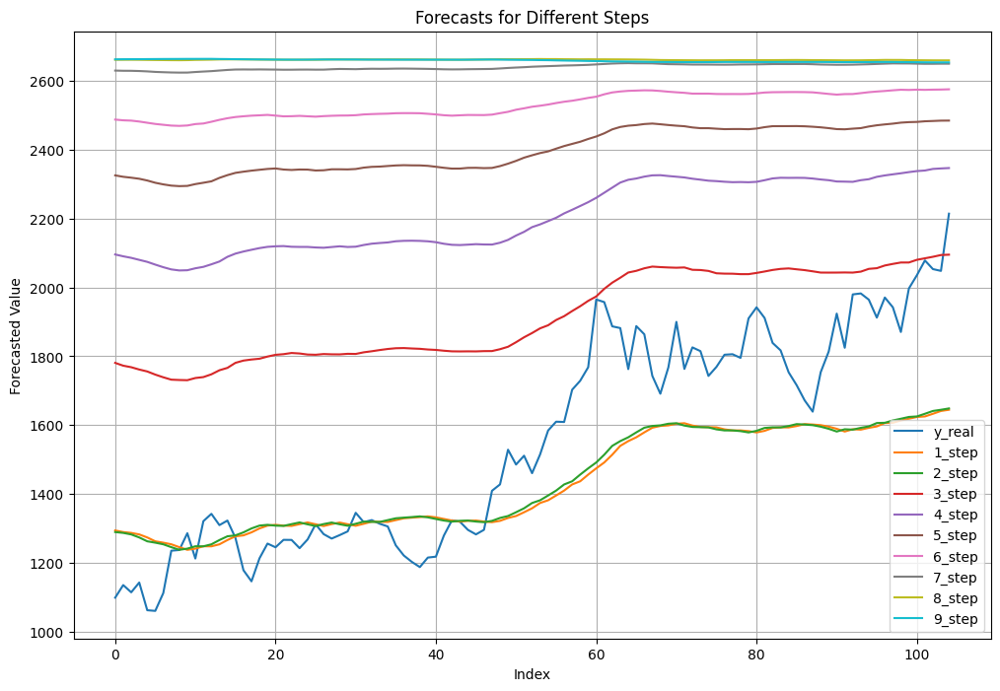

In [ ]:
# Example parameters
seq_length = 32  # Look-back period (number of past time steps)
n_steps = 9      # Forecast up to 6 steps ahead
epochs = 100     # Number of training epochs
batch_size = 0  # Batch size for training
wavelet = 'cgau6' # Continuous wavelet to use  mexh shan  cmor  morl cgau1, cgau5  paul  morl
# ['cgau1', 'cgau2', 'cgau3', 'cgau4', 'cgau5', 'cgau6', 'cgau7', 'cgau8',  'cmor', 'fbsp',
# 'gaus1', 'gaus2', 'gaus3', 'gaus4', 'gaus5', 'gaus6',  'gaus7', 'gaus8', 'mexh', 'morl', 'shan']

scales = np.arange(1, 4)  # Scales for CWT
output_file = "forecast_results_M.xlsx"  # Excel output file for forecast results

# Perform the forecasting
forecast_results = wave_cnn_lstm_forecasting(
    data=data,
    seq_length=seq_length,
    n_steps=n_steps,
    epochs=epochs,
    batch_size=batch_size,
    wavelet=wavelet,
    scales=scales,
    output_file=output_file
)


In [ ]:
%print(pywt.wavelist(kind='discrete'))

['bior1.1', 'bior1.3', 'bior1.5', 'bior2.2', 'bior2.4', 'bior2.6', 'bior2.8', 'bior3.1', 'bior3.3', 'bior3.5', 'bior3.7', 'bior3.9', 'bior4.4', 'bior5.5', 'bior6.8', 'coif1', 'coif2', 'coif3', 'coif4', 'coif5', 'coif6', 'coif7', 'coif8', 'coif9', 'coif10', 'coif11', 'coif12', 'coif13', 'coif14', 'coif15', 'coif16', 'coif17', 'db1', 'db2', 'db3', 'db4', 'db5', 'db6', 'db7', 'db8', 'db9', 'db10', 'db11', 'db12', 'db13', 'db14', 'db15', 'db16', 'db17', 'db18', 'db19', 'db20', 'db21', 'db22', 'db23', 'db24', 'db25', 'db26', 'db27', 'db28', 'db29', 'db30', 'db31', 'db32', 'db33', 'db34', 'db35', 'db36', 'db37', 'db38', 'dmey', 'haar', 'rbio1.1', 'rbio1.3', 'rbio1.5', 'rbio2.2', 'rbio2.4', 'rbio2.6', 'rbio2.8', 'rbio3.1', 'rbio3.3', 'rbio3.5', 'rbio3.7', 'rbio3.9', 'rbio4.4', 'rbio5.5', 'rbio6.8', 'sym2', 'sym3', 'sym4', 'sym5', 'sym6', 'sym7', 'sym8', 'sym9', 'sym10', 'sym11', 'sym12', 'sym13', 'sym14', 'sym15', 'sym16', 'sym17', 'sym18', 'sym19', 'sym20']


Shape after wavelet decomposition: (147, 24, 1)
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 1 is too high: all coefficients will experience boundary effects.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.0617
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0220 
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0193 
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0146 
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0136 
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0136  
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0126 
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0127 
Epoch 9/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0112 
Epoch 10/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0095 
Epoch 11/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0092  
Epoch 12/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0096 
Epoch 13/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0095 
Epoch 14/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0086 
Epoch 15/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0078 
Epoch 16/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/

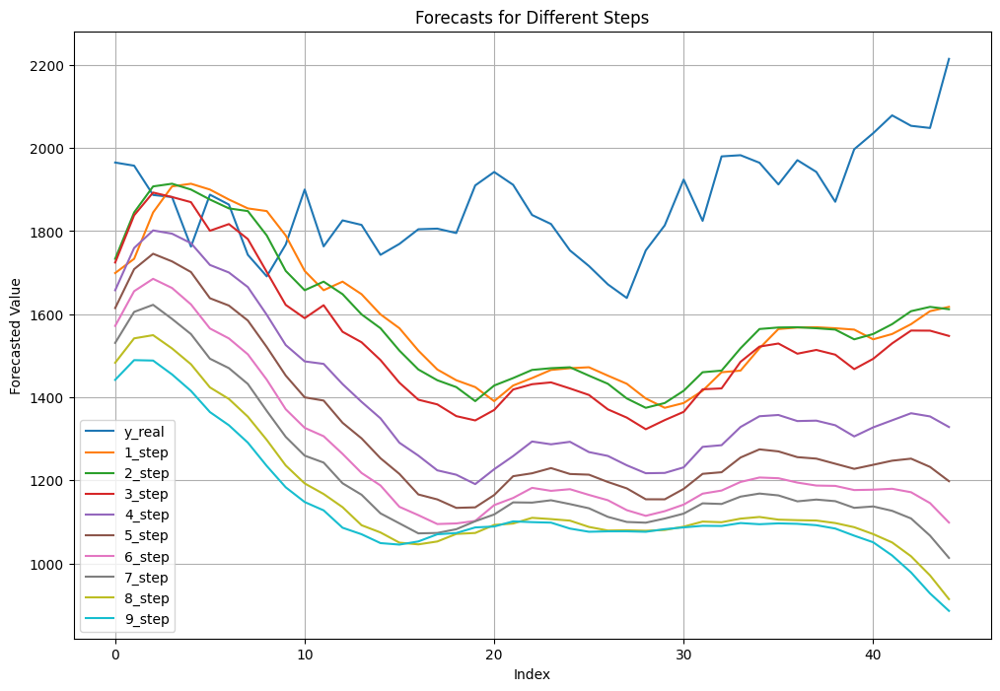

    y_real       1_step       2_step       3_step       4_step       5_step  \
0  1964.90  1699.048584  1733.224121  1724.270142  1657.552246  1614.678711   
1  1957.35  1733.224121  1844.805664  1837.955200  1759.328979  1708.364502   
2  1886.90  1844.805664  1907.441040  1892.671509  1801.553955  1745.425293   
3  1881.85  1907.441040  1913.907349  1881.921265  1793.718750  1727.034424   
4  1762.55  1913.907349  1899.894531  1869.556152  1770.861206  1701.361450   

        6_step       7_step       8_step       9_step  
0  1571.719116  1530.930542  1483.176270  1442.020996  
1  1655.329224  1605.509521  1541.856689  1489.453613  
2  1685.119629  1622.530762  1549.537598  1488.435303  
3  1663.030396  1588.654541  1517.618408  1455.070923  
4  1623.510132  1552.068604  1479.499756  1415.348877  


In [ ]:
# Apply the wave_cnn_lstm_forecasting function to forecast
forecast_results = wave_cnn_lstm_forecasting(
    data=data,            # DataFrame with 'temps' as the index and 'price' as the feature
    seq_length=24,      # Sequence length for time steps (e.g., 24 time steps)
    n_steps=9,          # Predict 1 to 6 steps ahead
    test_size=0.3,      # 30% test size for splitting train and test data
    epochs=50,          # Number of epochs for training the model
    batch_size=16,      # Batch size for training
    output_file="forecast_results.xlsx"  # Output file for saving forecast results
)

# Display the forecast results
print(forecast_results.head())